# Testing the Flow framework in 2D

The objective of this notebook is to test flow matching by:
- Constructing 2D paths between known distributions
- Observing if the target velocities makes sense
- Seeing if x0 <-> x1 <-> v parameterization change works as intended
- Running a single training step
- Training a full model on this simple example and observing the results

First, we begin by loading and visualizing the dataset:

In [1]:
# Navigate to the root of the project
import sys
import os
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

sys.path.append(os.path.abspath("../src"))
# We change the working directory to the root of the project
# Run this only once
root_path = Path.cwd().parent
os.chdir(root_path)
sys.path.append(root_path / "src")

In [2]:
import numpy as np


from experiments.datasets.datasets import GMM2GMM, get_first_example_dataset, get_second_example_dataset
from torch.utils.data import DataLoader


dataset = get_second_example_dataset(500000)
loader = DataLoader(dataset, batch_size=512, shuffle=True)

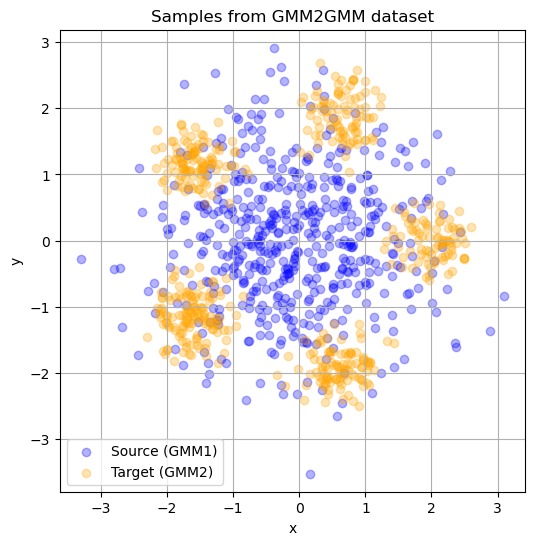

In [3]:
# Let's visualize the first batch

batch = next(iter(loader))
x0, x1 = batch  # assuming your dataset returns (source, target)

# Plot
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')
plt.legend()
plt.axis('equal')
plt.title('Samples from GMM2GMM dataset')
plt.xlabel('x')
plt.ylabel('y')
plt.grid(True)
plt.show()

Now, we load a toy flow model:

In [4]:
from hydra.utils import instantiate
from omegaconf import OmegaConf
import os
os.environ["HYDRA_FULL_ERROR"] = "1"

model_cfg = OmegaConf.load("confs/toy_flow.yaml")
flow_model = instantiate(model_cfg.flow_model)

Let's observe some random points sampled during training and their associated velocities:

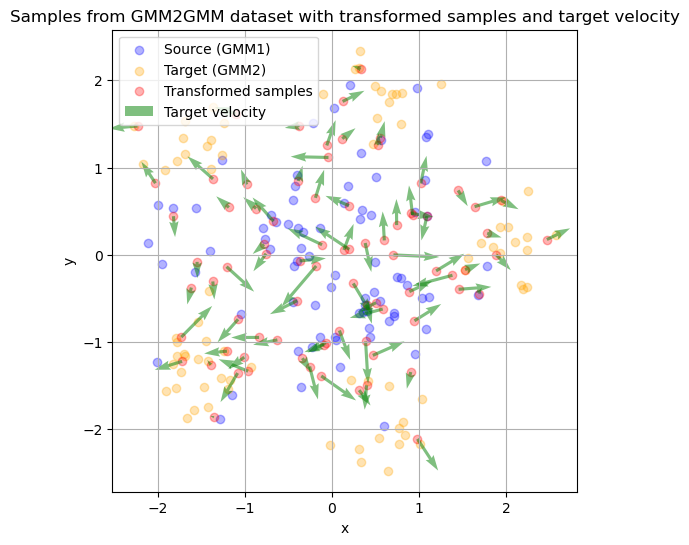

In [5]:
loader = DataLoader(dataset, batch_size=80, shuffle=True)

batch = next(iter(loader))
x0, x1 = batch  # assuming your dataset returns (source, target)

t, x_t = flow_model.path.sample(x_0=x0, x_1=x1)

target_vectors = flow_model.target_velocity(t, x0, x1)
plt.figure(figsize=(6, 6))

plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')
plt.scatter(x_t[:, 0], x_t[:, 1], color='red', alpha=0.3, label='Transformed samples')
plt.quiver(x_t[:, 0], x_t[:, 1], target_vectors[:, 0], target_vectors[:, 1], color='green', alpha=0.5, label='Target velocity')
plt.legend()
plt.axis('equal')
plt.title('Samples from GMM2GMM dataset with transformed samples and target velocity')
plt.xlabel('x')
plt.ylabel('y')
plt.grid(True)
plt.show()

We test for one training step and then train a full model:

In [6]:
loader = DataLoader(dataset, batch_size=20000, shuffle=True)
batch = next(iter(loader))

flow_model.training_step(batch, 0)

/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/core/module.py:441: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


tensor(2.0918, grad_fn=<MseLossBackward0>)

In [7]:
import logging

logging.basicConfig(level=logging.INFO)

trainer_cfg = OmegaConf.load("confs/toy_trainer.yaml")
trainer = instantiate(trainer_cfg.trainer)

# train the model
trainer.fit(flow_model, train_dataloaders=loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
wandb: Currently logged in as: mathis-wauquiez (mathis-wauquiez-cole-des-ponts-paristech) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type               | Params | Mode 
-----------------------------------------------------
0 | model | TimeConditionedMLP | 13.3 K | train
1 | path  | AffinePath         | 0      | train
-----------------------------------------------------
13.3 K    Trainable params
0         Non-trainable params
13.3 K    Total params
0.053     Total estimated model params size (MB)
13        Modules in train mode
0         Modules in eval mode
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
INFO:experiments.callback.progress:Training started


Training: |          | 0/? [00:00<?, ?it/s]

INFO:experiments.callback.progress:Epoch 0: loss 2.034e+00
INFO:experiments.callback.progress:Epoch 1: loss 1.670e+00
INFO:experiments.callback.progress:Epoch 2: loss 1.073e+00
INFO:experiments.callback.progress:Epoch 3: loss 9.070e-01
INFO:experiments.callback.progress:Epoch 4: loss 8.788e-01
INFO:experiments.callback.progress:Epoch 5: loss 8.630e-01
INFO:experiments.callback.progress:Epoch 6: loss 8.627e-01
INFO:experiments.callback.progress:Epoch 7: loss 8.593e-01
INFO:experiments.callback.progress:Epoch 8: loss 8.559e-01
INFO:experiments.callback.progress:Epoch 9: loss 8.516e-01
INFO:experiments.callback.progress:Epoch 10: loss 8.515e-01
INFO:experiments.callback.progress:Epoch 11: loss 8.508e-01
INFO:experiments.callback.progress:Epoch 12: loss 8.478e-01
INFO:experiments.callback.progress:Epoch 13: loss 8.473e-01
INFO:experiments.callback.progress:Epoch 14: loss 8.474e-01
INFO:experiments.callback.progress:Epoch 15: loss 8.465e-01
INFO:experiments.callback.progress:Epoch 16: loss 

Let's test the estimated velocities:

Average target velocity norm: tensor(2.0737)
Average estimated velocity norm: tensor(1.7052)


Text(0.5, 1.0, 'Samples from GMM2GMM dataset with transformed samples and estimated velocity')

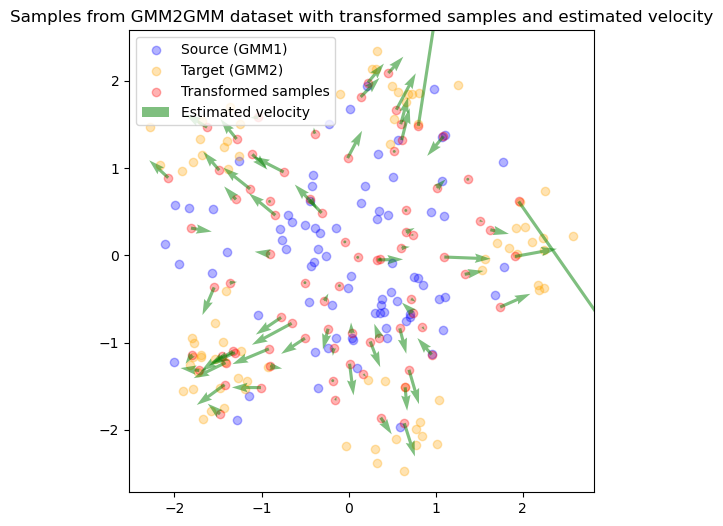

In [8]:
flow_model.eval()
flow_model.path.eval()

t, x_t= flow_model.path.sample(x_0=x0, x_1=x1)
v = flow_model.estimated_velocity(t, x_t).detach()

print("Average target velocity norm:", target_vectors.norm(dim=1).mean())
print("Average estimated velocity norm:", v.norm(dim=1).mean())

plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')
plt.scatter(x_t[:, 0], x_t[:, 1], color='red', alpha=0.3, label='Transformed samples')
plt.quiver(x_t[:, 0], x_t[:, 1], v[:, 0], v[:, 1], color='green', alpha=0.5, label='Estimated velocity')
plt.legend()
plt.axis('equal')
plt.title('Samples from GMM2GMM dataset with transformed samples and estimated velocity')

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_estimated_velocity(estimated_velocity, device="cuda"):
    # === Grid ===
    grid_size = 20
    x_vals = np.linspace(-3, 3, grid_size)
    y_vals = np.linspace(-3, 3, grid_size)
    X, Y = np.meshgrid(x_vals, y_vals)
    XY = np.stack([X.ravel(), Y.ravel()], axis=1)  # shape (grid_size^2, 2)
    XY_torch = torch.tensor(XY, dtype=torch.float32, device=device)  # (N, 2)

    # === Time steps ===
    time_steps = torch.linspace(0, 1, 100, device=device)

    # === Figure setup ===
    fig, ax = plt.subplots(figsize=(6, 6))
    plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')

    plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

    quiver = ax.quiver(X, Y, np.zeros_like(X), np.zeros_like(Y))
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.set_title("Estimated Velocity Field over Time")

    # === Animation function ===
    def update(frame):
        t = time_steps[frame]
        t_tensor = t.expand(XY_torch.shape[0])  # (N,)
        v = estimated_velocity(t_tensor, XY_torch)  # (N, 2)
        v_cpu = v.detach().cpu().numpy()
        U = v_cpu[:, 0].reshape(grid_size, grid_size)
        V = v_cpu[:, 1].reshape(grid_size, grid_size)
        quiver.set_UVC(U, V)
        ax.set_title(f"Velocity Field at t = {t.item():.2f}")
        return quiver,

    ani = FuncAnimation(fig, update, frames=100, interval=50)
    plt.close(fig)  # Prevents double display in notebooks
    return ani

from IPython.display import HTML


def estimate_score(t, x_t):
    if (t==0).any() or (t==1).any():
        return torch.zeros_like(x_t)+0.1
    v = flow_model.path.estimated_velocity(t, x_t)
    score= flow_model.path.convert_parameterization(t, x_t, v, "v", "score")
    normalized_score = score / torch.norm(score, dim=1, keepdim=True)
    return normalized_score/5


def estimate_velocity(t, x_t):
    v = flow_model.estimated_velocity(t, x_t)
    return v

ani = animate_estimated_velocity(estimate_velocity, device='cpu')
HTML(ani.to_jshtml())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Text(0.5, 0, 't')

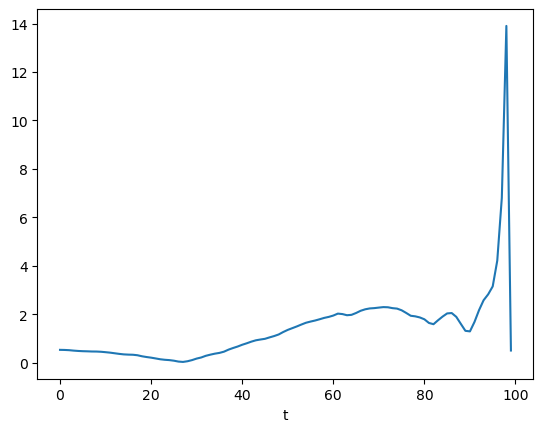

In [10]:
def plot_anchors():
    plt.figure(figsize=(6, 6))
    plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
    plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')


xt_ = x0[:2]

data = []

for t in np.linspace(0.01, 1, 100):
    v = flow_model.estimated_velocity(t, xt_)
    data.append(v.norm(dim=1).mean().item())

plt.plot(data)
plt.xlabel('t')

In [11]:
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation

loader = DataLoader(dataset, batch_size=500, shuffle=True)

batch = next(iter(loader))
x0, x1 = batch  # assuming your dataset returns (source, target)


# Parameters
N = 100            # number of particles
T = 1.0           # final time
steps = 100       # Euler steps
dt = T / steps    # time step

# Sample 10 initial particles
x0 = x0[:N]  # shape (N, D)
trajectories = [x0]
x_t = x0.clone()

for i in range(steps):
    t = torch.tensor(i * dt + 0.001, device=x0.device)  # scalar tensor
    v = flow_model.estimated_velocity(t, x_t)  # shape (N, D)
    x_t = x_t + dt * v
    # print the average norm of the velocity
    print(f"Step {i}: {v.norm(dim=1).mean().item()}")
    # Store the trajectory
    trajectories.append(x_t.clone())

trajectories = torch.stack(trajectories)  # shape (steps+1, N, D)
trajectories = trajectories.detach().cpu().numpy()

print(trajectories)
# Create 2D animation
fig, ax = plt.subplots()
lines = [ax.plot([], [], 'o')[0] for _ in range(N)]

def init():
    ax.set_xlim(trajectories[:, :, 0].min() - 1, trajectories[:, :, 0].max() + 1)
    ax.set_ylim(trajectories[:, :, 1].min() - 1, trajectories[:, :, 1].max() + 1)
    return lines

def animate(i):
    for j, line in enumerate(lines):
        x = trajectories[i, j, 0]
        y = trajectories[i, j, 1]
        line.set_data([x], [y])  # wrap in list to make it a sequence
    return lines

# Create animation object (unchanged)
ani = animation.FuncAnimation(
    fig, animate, frames=len(trajectories), init_func=init, blit=True, interval=40
)
from IPython.display import HTML
# Display in notebook
plt.close(fig)  # prevents duplicate static image
HTML(ani.to_jshtml())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Step 0: 1.1609902381896973
Step 1: 1.126509189605713
Step 2: 1.113906741142273
Step 3: 1.0962905883789062
Step 4: 1.075308918952942
Step 5: 1.051052451133728
Step 6: 1.0242334604263306
Step 7: 0.9934933185577393
Step 8: 0.9585080146789551
Step 9: 0.9220478534698486
Step 10: 0.8847106099128723
Step 11: 0.8457717895507812
Step 12: 0.8058093786239624
Step 13: 0.7631155252456665
Step 14: 0.722861111164093
Step 15: 0.6856441497802734
Step 16: 0.650333046913147
Step 17: 0.6157073974609375
Step 18: 0.5803338885307312
Step 19: 0.5400054454803467
Step 20: 0.4956939220428467
Step 21: 0.4482029676437378
Step 22: 0.40203341841697693
Step 23: 0.3574407994747162
Step 24: 0.3095635175704956
Step 25: 0.2600213289260864
Step 26: 0.21791252493858337
Step 27: 0.1750698685646057
Step 28: 0.14760497212409973
Step 29: 0.14510588347911835
Step 30: 0.1560002863407135
Step 31: 0.17878319323062897
Step 32: 0.21280185878276825
Step 33: 0.25807708501815796
Step 34: 0.30702105164527893
Step 35: 0.36143916845321655

/tmp/ipykernel_4423/1631704541.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', T)


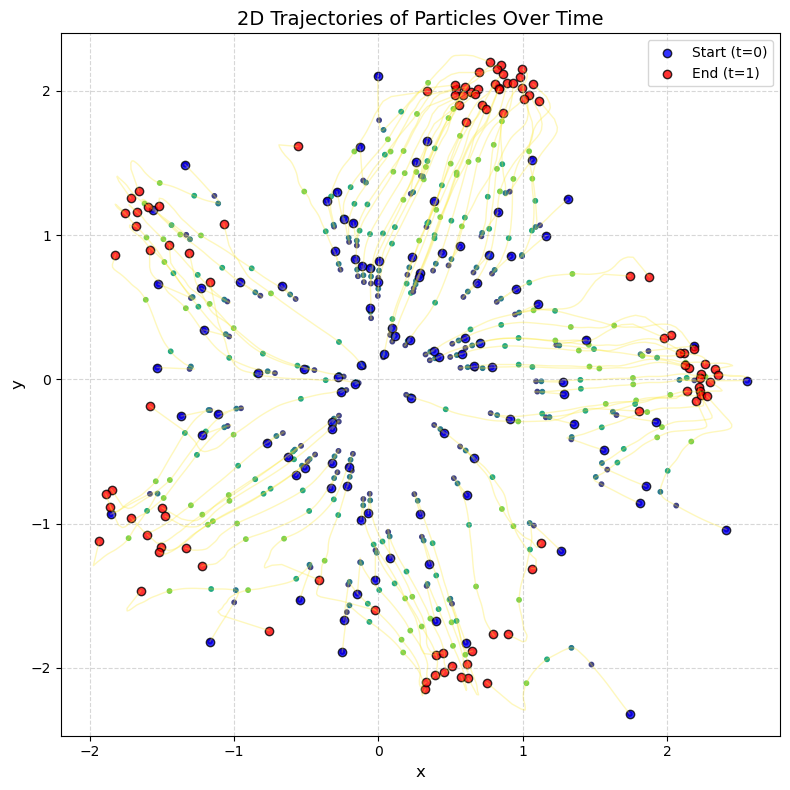

In [13]:
from torchdiffeq import odeint

t = torch.linspace(0.01, 1, 100)

trajectories = odeint(
    flow_model.estimated_velocity,
    x0,
    t
) # (100, 30, 2)

import torch
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Assumes: trajectories.shape = (T, B, 2)
T, B, _ = trajectories.shape

trajectories = trajectories.detach().numpy()  # Convert to numpy for plotting

plt.figure(figsize=(8, 8))
cmap = cm.get_cmap('viridis', T)
colors = cmap(np.linspace(0, 1, T))

# Plot each trajectory
for i in range(B):
    traj = trajectories[:, i, :]  # shape (T, 2)
    plt.plot(traj[:, 0], traj[:, 1], color=colors[-1], alpha=0.3, linewidth=1)
    
    # Colored dots to show time progression
    plt.scatter(traj[::20, 0], traj[::20, 1], c=colors[::20], s=10, label='_nolegend_')

    # Direction arrows every 20 steps
    plt.quiver(
        traj[:-1:20, 0], traj[:-1:20, 1],
        traj[1::20, 0] - traj[:-1:20, 0],
        traj[1::20, 1] - traj[:-1:20, 1],
        angles='xy', scale_units='xy', scale=1.0, width=0.002, alpha=0.4, color='gray'
    )

# Start and end positions
plt.scatter(trajectories[0, :, 0], trajectories[0, :, 1], color='blue', label='Start (t=0)', alpha=0.8, edgecolors='black')
plt.scatter(trajectories[-1, :, 0], trajectories[-1, :, 1], color='red', label='End (t=1)', alpha=0.8, edgecolors='black')

# Decorations
plt.legend(loc='best', fontsize=10)
plt.title('2D Trajectories of Particles Over Time', fontsize=14)
plt.xlabel('x', fontsize=12)
plt.ylabel('y', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.axis('equal')
plt.tight_layout()
plt.show()


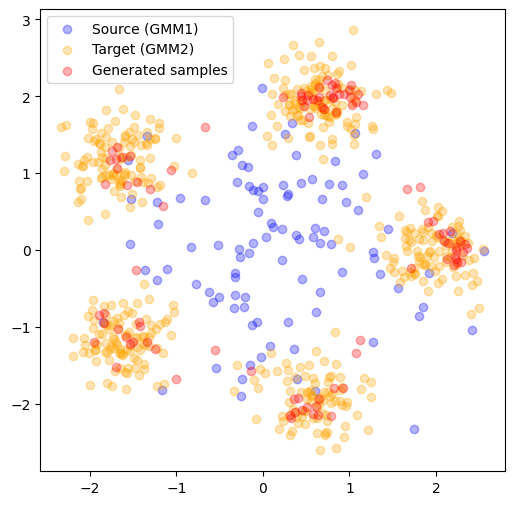

In [14]:
gen = flow_model.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()